## Almacenamiento de álbumes

In [1]:
# Cargas y transformaciones
import pandas as pd
# Procesar información vectorial
import numpy as np

## Módulos adicionales
import unicodedata # Permite transformar texto
import re # Procesar texto
import sqlite3 # Conectar en bd local

In [ ]:
url = "https://es.wikipedia.org/wiki/Anexo:Discograf%C3%ADa_de_Shakira"

In [3]:
df = pd.read_html(url)[1]

In [ ]:
df.columns = df.columns.droplevel(1)

In [ ]:
df.columns

Index(['Título', 'Detalles del álbum', 'Posicionamiento en listas',
       'Posicionamiento en listas', 'Posicionamiento en listas',
       'Posicionamiento en listas', 'Posicionamiento en listas',
       'Posicionamiento en listas', 'Posicionamiento en listas',
       'Posicionamiento en listas', 'Posicionamiento en listas',
       'Posicionamiento en listas', 'Posicionamiento en listas',
       'Certificaciones'],
      dtype='object')

In [ ]:
df = df.iloc[:, :2]

In [ ]:
df['Lanzamiento'] = df['Lanzamiento'].str.replace("()","").str.replace("(US)","").str.replace("(WW)","").str.replace("(GER)","")

In [ ]:
# df['Lanzamiento'] = df['Lanzamiento'].str.replace(r'\([^()]*\)', '', regex=True)

#df['Lanzamiento'] = df['Lanzamiento'].str.replace(r'\[\d+\]​', '', regex=True)
df['Lanzamiento'] = df['Lanzamiento'].str.strip()

In [ ]:
df[['Discográfica', 'Resto']] = df['Discográfica'].str.split('Formato', 1, expand=True)

<ipython-input-65-fc77d77ca2ee>:1: FutureWarning: In a future version of pandas all arguments of StringMethods.split except for the argument 'pat' will be keyword-only.
  df[['Discográfica', 'Resto']] = df['Discográfica'].str.split('Formato', 1, expand=True)


In [ ]:
df = df.drop(["Resto"],axis=1)

In [ ]:
df['Discográfica'] = df['Discográfica'].str.replace(': ', '', regex=False)

In [ ]:
df = df.drop(["Detalles del álbum"],axis=1)

In [ ]:
df =

,Título,Lanzamiento,Discográfica
0,Magia,24 de junio de 1991,Sony Colombia
1,Peligro,25 de marzo de 1993,Sony Colombia
2,Pies descalzos,6 de octubre de 1995,Sony Music
3,¿Dónde están los ladrones?,29 de septiembre de 1998,Sony Music Latin
4,Servicio de lavandería,13 de noviembre de 2001,Epic
5,Fijación oral vol. 1,3 de junio de 2005,Epic
6,Oral Fixation vol. 2,28 de noviembre de 2005,Epic
7,She Wolf,9 de octubre de 2009,Epic
8,Sale el Sol,19 de octubre de 2010,Epic
9,Shakira,21 de marzo de 2014,"RCA, Live Nation, Sony Music Latin"


from matplotlib import pyplot as plt
import seaborn as sns
df.groupby('Discográfica').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

In [ ]:
df = df.drop(df.tail(1).index)

In [ ]:
df[['Lanzamiento', 'Discográfica']] = df['Detalles del álbum'].str.split('Discográfica', 1, expand=True)

<ipython-input-44-018db04f2504>:1: FutureWarning: In a future version of pandas all arguments of StringMethods.split except for the argument 'pat' will be keyword-only.
  df[['Lanzamiento', 'Discográfica']] = df['Detalles del álbum'].str.split('Discográfica', 1, expand=True)


In [2]:
df_albumes = pd.read_csv("albumes-shakira.csv",encoding="latin-1",sep=";")

In [5]:
df_albumes

,index,Título,Lanzamiento,Discográfica
0,0,Magia,24 de junio de 1991,Sony Colombia
1,1,Peligro,25 de marzo de 1993,Sony Colombia
2,2,Pies descalzos,6 de octubre de 1995,Sony Music
3,3,¿Dónde están los ladrones?,29 de septiembre de 1998,Sony Music Latin
4,4,Servicio de lavandería,13 de noviembre de 2001,Epic
5,5,Fijación oral vol. 1,3 de junio de 2005,Epic
6,6,Oral Fixation vol. 2,28 de noviembre de 2005,Epic
7,7,She Wolf,9 de octubre de 2009,Epic
8,8,Sale el Sol,19 de octubre de 2010,Epic
9,9,Shakira,21 de marzo de 2014,"RCA, Live Nation, Sony Music Latin"


## Almacenamiento de canciones por álbum

In [5]:
from bs4 import BeautifulSoup
import requests
from colorama import Fore
from tabulate import tabulate

### Álbum Magia

In [ ]:
url = "https://es.wikipedia.org/wiki/Magia_(%C3%A1lbum)"

response = requests.get(url)
html = response.text
soup = BeautifulSoup(html, 'html.parser')
tabla = soup.find_all('table')

html_2 = tabla[2].text
print(type(html_2))

In [10]:
filas = tabla[2].find_all('tr')
encabezados = [th.text.strip() for th in filas[0].find_all('th')]
datos = []
for fila in filas[1:]:
    fila_datos = [td.text.strip() for td in fila.find_all('td')]
    datos.append(fila_datos)
df_magia = pd.DataFrame(datos, columns=encabezados)

if df_magia.iloc[-1].isnull().all():
    df_magia = df_magia.iloc[:-1]

df_magia['Álbum'] = 'Magia'
print(df_magia)

  N.º                            Título                    Escritor(es)  \
0  1.                          «Sueños»                         Shakira   
1  2.          «Esta noche voy contigo»         Miguel Enrique Cubillos   
2  3.                «Lejos de tu amor»                  Pablo Tedeschi   
3  4.                           «Magia»                         Shakira   
4  5.                 «Cuentas conmigo»  Juanita Loboguerrero; Cubillos   
5  6.                 «Cazador de amor»                         Shakira   
6  7.                   «Gafas oscuras»                         Shakira   
7  8.                  «Necesito de ti»                         Shakira   
8  9.  «Lejos de tu amor» (Versión Mix)                        Tedeschi   

  Duración  Álbum  
0     3:47  Magia  
1     3:53  Magia  
2     3:09  Magia  
3     4:43  Magia  
4     4:01  Magia  
5     3:07  Magia  
6     3:13  Magia  
7     3:41  Magia  
8     3:13  Magia  


### Álbum Peligro

In [11]:
url = "https://es.wikipedia.org/wiki/Peligro_(%C3%A1lbum_de_Shakira)"
response = requests.get(url)
html = response.text
soup = BeautifulSoup(html, 'html.parser')
tabla = soup.find_all('table')

print(tabla[3])

<table cellpadding="0" class="tracklist" style="border-collapse: collapse; padding: 4px;"><tbody><tr><th class="tlheader mbox-text" colspan="10" style="text-align: left; background-color: #fff; width: 100%; ;"><span class="flagicon"><span class="mw-image-border" typeof="mw:File"><a class="mw-file-description" href="/wiki/Archivo:Flag_of_Colombia.svg" title="Bandera de Colombia"><img alt="Bandera de Colombia" class="mw-file-element" data-file-height="600" data-file-width="900" decoding="async" height="13" src="//upload.wikimedia.org/wikipedia/commons/thumb/2/21/Flag_of_Colombia.svg/20px-Flag_of_Colombia.svg.png" srcset="//upload.wikimedia.org/wikipedia/commons/thumb/2/21/Flag_of_Colombia.svg/30px-Flag_of_Colombia.svg.png 1.5x, //upload.wikimedia.org/wikipedia/commons/thumb/2/21/Flag_of_Colombia.svg/40px-Flag_of_Colombia.svg.png 2x" width="20"/></a></span></span> <i>Peligro</i></th><td class="mbox-empty-cell"></td></tr><tr><th style="width: 20px; padding-left: 10px; padding-right: 10px; 

In [12]:
filas = tabla[3].find_all('tr')
encabezados = [th.text.strip() for th in filas[1].find_all('th')]

datos = []
for fila in filas[2:]:
    fila_datos = [td.text.strip() for td in fila.find_all('td')]
    datos.append(fila_datos)

df_peligro = pd.DataFrame(datos, columns=encabezados)

if df_peligro.iloc[-1].isnull().all():
    df_peligro = df_peligro.iloc[:-1]
    
df_peligro['Álbum'] = 'Peligro'
print(df_peligro)

   N.º                                             Título   Escritor(es)  \
0   1.                                             «Eres»        Shakira   
1   2.                                   «Último momento»    Eduardo Paz   
2   3.  «Tú serás la historia de mi vida» (You'll Be T...  Desmond Child   
3   4.                                          «Peligro»            Paz   
4   5.                                      «Quince años»        Shakira   
5   6.                                         «Brujería»            Paz   
6   7.                                      «Eterno amor»   Eddie Sierra   
7   8.                             «Controlas mi destino»        Shakira   
8   9.              «Este amor es lo más bello del mundo»            Paz   
9  10.                                             «1968»   Shakira, Paz   

  Duración    Álbum  
0     5:02  Peligro  
1     4:56  Peligro  
2     4:52  Peligro  
3     4:39  Peligro  
4     3:30  Peligro  
5     4:08  Peligro  
6     4:4

### Álbum Pies Descalzos

In [13]:
url = "https://es.wikipedia.org/wiki/Pies_descalzos"
response = requests.get(url)
html = response.text
soup = BeautifulSoup(html, 'html.parser')
tabla = soup.find_all('table')

print(tabla[8])

<table cellpadding="0" class="tracklist" style="border-collapse: collapse; padding: 4px;"><tbody><tr><th style="width: 20px; padding-left: 10px; padding-right: 10px; text-align: center; background-color: #eee; height: 20px;">N.º</th><th style="text-align: left; background-color: #eee; width: 100%;">Título</th><th style="padding-right: 5px; width: 60px; text-align: center; background-color: #eee;">Duración</th><td class="mbox-empty-cell"></td></tr><tr><td style="padding-right: 10px; text-align: right; cursor: default; -webkit-user-select:none; -moz-user-select:none; background-color: #fff;">1.</td><td style="text-align: left; background-color: #fff;">«Estoy aquí»</td><td style="padding-right: 10px; text-align: right; background-color: #fff;">3:52</td></tr><tr><td style="padding-right: 10px; text-align: right; cursor: default; -webkit-user-select:none; -moz-user-select:none; background-color: #f7f7f7;">2.</td><td style="text-align: left; background-color: #f7f7f7;">«Antología»</td><td st

In [14]:
filas = tabla[8].find_all('tr')
encabezados = [th.text.strip() for th in filas[0].find_all('th')]

datos = []
for fila in filas[1:]:
    fila_datos = [td.text.strip() for td in fila.find_all('td')]
    datos.append(fila_datos)

df_pies_descalzos = pd.DataFrame(datos, columns=encabezados)

if df_pies_descalzos.iloc[-1].isnull().all():
    df_pies_descalzos = df_pies_descalzos.iloc[:-1]

df_pies_descalzos['Álbum'] = 'Pies Descalzos'
print(df_pies_descalzos)

## TODAS LAS CANCIONES SON ESCRITAS POR SHAKIRA Y LUIS FERNANDO OCHOA

    N.º                                             Título Duración  \
0    1.                                       «Estoy aquí»     3:52   
1    2.                                        «Antología»     4:14   
2    3.            «Un poco de amor» (con Howard Glasford)     4:01   
3    4.                                           «Quiero»     4:10   
4    5.                                      «Te necesito»     4:00   
5    6.                                «Te espero sentada»     3:24   
6    7.                   «Pies descalzos, sueños blancos»     3:25   
7    8.                                           «Vuelve»     3:53   
8    9.                                     «Pienso en ti»     2:25   
9   10.                            «¿Dónde estás corazón?»     3:51   
10  11.                               «Se quiere, se mata»     3:38   
11  12.  «Estoy aquí» (The Love & House Mix) (Pista extra)     8:31   
12  13.            «Estoy aquí» (Radio edit) (Pista extra)     4:40   

     

### Álbum ¿Dónde están los ladrones?

In [15]:
url = "https://es.wikipedia.org/wiki/Pies_descalzos"
response = requests.get(url)
html = response.text
soup = BeautifulSoup(html, 'html.parser')
tabla = soup.find_all('table')

print(tabla[10])

<table cellpadding="0" class="tracklist" style="border-collapse: collapse; padding: 4px;"><tbody><tr><th style="width: 20px; padding-left: 10px; padding-right: 10px; text-align: center; background-color: #eee; height: 20px;">N.º</th><th style="text-align: left; background-color: #eee; width: 40%;">Título</th><th style="text-align: left; background-color: #eee; width: 30%;">Escritor(es)</th><th style="text-align: left; background-color: #eee; width: 30%;">Productor(es)</th><th style="padding-right: 5px; width: 60px; text-align: center; background-color: #eee;">Duración</th><td class="mbox-empty-cell"></td></tr><tr><td style="padding-right: 10px; text-align: right; cursor: default; -webkit-user-select:none; -moz-user-select:none; background-color: #fff;">1.</td><td style="text-align: left; background-color: #fff;">«<a href="/wiki/Ciega,_sordomuda" title="Ciega, sordomuda">Ciega, sordomuda</a>»</td><td style="background-color: #fff;">Shakira</td><td style="background-color: #fff;">Shakira

In [16]:
filas = tabla[10].find_all('tr')
encabezados = [th.text.strip() for th in filas[0].find_all('th')]

datos = []
for fila in filas[1:]:
    fila_datos = [td.text.strip() for td in fila.find_all('td')]
    datos.append(fila_datos)

df_dell = pd.DataFrame(datos, columns=encabezados)

if df_dell.iloc[-1].isnull().all():
    df_dell = df_dell.iloc[:-1]

df_dell['Álbum'] = '¿Dónde están los ladrones?'
print(df_dell)

    N.º                        Título                   Escritor(es)  \
0    1.            «Ciega, sordomuda»                        Shakira   
1    2.                   «Si te vas»  Shakira y Luis Fernando Ochoa   
2    3.           «Moscas en la casa»                        Shakira   
3    4.                     «No creo»  Shakira y Luis Fernando Ochoa   
4    5.                  «Inevitable»                        Shakira   
5    6.                  «Octavo día»                        Shakira   
6    7.                 «Que vuelvas»                        Shakira   
7    8.                          «Tú»              Shakira y O'Brien   
8    9.  «¿Dónde están los ladrones?»  Shakira y Luis Fernando Ochoa   
9   10.                «Sombra de ti»                        Shakira   
10  11.                    «Ojos así»  Shakira y Luis Fernando Ochoa   

                           Productor(es) Duración                       Álbum  
0                                Shakira     4:28  ¿Dón

### Álbum Servicio de lavandería

In [17]:
url = "https://es.wikipedia.org/wiki/Servicio_de_lavander%C3%ADa"
response = requests.get(url)
html = response.text
soup = BeautifulSoup(html, 'html.parser')
tabla = soup.find_all('table')

print(len(tabla))

19


In [18]:
filas = tabla[3].find_all('tr')

data = []
for fila in filas:
    cols = fila.find_all(['th', 'td'])
    cols = [col.text.strip() for col in cols]
    data.append(cols)
    #print(data)

data = data[1:]
data[0] = data[0][:-1]
#print(data)

#data = [fila for fila in data if fila and ':' in fila[-1]]
df_serv_lav = pd.DataFrame(data[1:-1], columns=data[0])
df_serv_lav['Álbum'] = 'Servicio de lavandería'
print(df_serv_lav)

    N.º                          Título  \
0    1.             «Objection (Tango)»   
1    2.       «Underneath Your Clothes»   
2    3.            «Whenever, Wherever»   
3    4.                         «Rules»   
4    5.                       «The One»   
5    6.      «Ready for the Good Times»   
6    7.                          «Fool»   
7    8.                «Te dejo Madrid»   
8    9.               «Poem to a Horse»   
9   10.              «Que me quedes tú»   
10  11.    «Eyes Like Yours (Ojos así)»   
11  12.   «Suerte (Whenever, Wherever)»   
12  13.  «Te aviso, te anuncio (tango)»   

                                    Escritor(es)  \
0                                Shakira, Méndez   
1                         Shakira, Lester Méndez   
2          Shakira, Gloria Estefan, Tim Mitchell   
3                                Shakira, Méndez   
4                          Shakira, Glen Ballard   
5                                Shakira, Méndez   
6                       Shakira, 

### Álbum Fijación oral vol. 1	

In [19]:
url = "https://es.wikipedia.org/wiki/Fijaci%C3%B3n_oral_vol._1"
response = requests.get(url)
html = response.text
soup = BeautifulSoup(html, 'html.parser')
tabla = soup.find_all('table')

print(len(tabla))

17


In [20]:
filas = tabla[4].find_all('tr')

data = []
for fila in filas:
    cols = fila.find_all(['th', 'td'])
    cols = [col.text.strip() for col in cols]
    data.append(cols)


data = data[1:]
data[0] = data[0][:-1]


df_fijacion_oral = pd.DataFrame(data[1:-1], columns=data[0])

df_fijacion_oral['Álbum'] = 'Fijación Oral Vol.1'

tab = df_fijacion_oral
# print(tabulate(tab,headers=tab.columns.tolist(),tablefmt='fancy_grid'))
#print(df_fijacion_oral)

### Álbum Fijación Oral 2

In [21]:
url = "https://es.wikipedia.org/wiki/Oral_Fixation_vol._2"
response = requests.get(url)
html = response.text
soup = BeautifulSoup(html, 'html.parser')
tabla = soup.find_all('table')

print(len(tabla))

7


In [22]:
tabla[3]

<table cellpadding="0" class="tracklist" style="border-collapse: collapse; padding: 4px;"><tbody><tr><th class="tlheader mbox-text" colspan="10" style="text-align: left; background-color: #fff; width: 100%; ;"><i>Re-edición</i></th><td class="mbox-empty-cell"></td></tr><tr><th style="width: 20px; padding-left: 10px; padding-right: 10px; text-align: center; background-color: #eee; height: 20px;">N.º</th><th style="text-align: left; background-color: #eee; width: 40%;">Título</th><th style="text-align: left; background-color: #eee; width: 30%;">Escritor(es)</th><th style="text-align: left; background-color: #eee; width: 30%;">Productor(es)</th><th style="padding-right: 5px; width: 60px; text-align: center; background-color: #eee;">Duración</th><td class="mbox-empty-cell"></td></tr><tr><td style="padding-right: 10px; text-align: right; cursor: default; -webkit-user-select:none; -moz-user-select:none; background-color: #fff;">1.</td><td style="text-align: left; background-color: #fff;">«<a

In [23]:
filas = tabla[3].find_all('tr')

data = []
for fila in filas:
    cols = fila.find_all(['th', 'td'])
    cols = [col.text.strip() for col in cols]
    data.append(cols)

data = data[1:]
data[0] = data[0][:-1]
#print(data)

df_fijacion_oral2 = pd.DataFrame(data[1:-1], columns=data[0])
df_fijacion_oral2['Álbum'] = 'Fijación Oral Vol.2'

tab = df_fijacion_oral2
# print(tabulate(tab,headers=tab.columns.tolist(),tablefmt='fancy_grid'))

### Album She Wolf

In [24]:
url = "https://es.wikipedia.org/wiki/Loba_(%C3%A1lbum)"
response = requests.get(url)
html = response.text
soup = BeautifulSoup(html, 'html.parser')
tabla = soup.find_all('table')

print(len(tabla))

20


In [25]:
tabla[4]

<table cellpadding="0" class="tracklist" style="border-collapse: collapse; padding: 4px;"><tbody><tr><th style="width: 20px; padding-left: 10px; padding-right: 10px; text-align: center; background-color: #eee; height: 20px;">N.º</th><th style="text-align: left; background-color: #eee; width: 40%;">Título</th><th style="text-align: left; background-color: #eee; width: 30%;">Escritor(es)</th><th style="text-align: left; background-color: #eee; width: 30%;">Producer(s)</th><th style="padding-right: 5px; width: 60px; text-align: center; background-color: #eee;">Duración</th><td class="mbox-empty-cell"></td></tr><tr><td style="padding-right: 10px; text-align: right; cursor: default; -webkit-user-select:none; -moz-user-select:none; background-color: #fff;">1.</td><td style="text-align: left; background-color: #fff;">«<a href="/wiki/Loba_(canci%C3%B3n)" title="Loba (canción)">She Wolf</a>»</td><td style="background-color: #fff;"><a href="/wiki/Shakira" title="Shakira">Shakira Mebarak</a></td>

In [26]:
filas = tabla[4].find_all('tr')

data = []
for fila in filas:
    cols = fila.find_all(['th', 'td'])
    cols = [col.text.strip() for col in cols]
    data.append(cols)

data[0] = data[0][:-1]

df_shewolf = pd.DataFrame(data[1:-1], columns=data[0])
df_shewolf['Álbum'] = 'She Wolf'

tab = df_shewolf
# print(tabulate(tab,headers=tab.columns.tolist(),tablefmt='fancy_grid'))

### Álbum Sale el sol

In [27]:
url = "https://es.wikipedia.org/wiki/Sale_el_sol"
response = requests.get(url)
html = response.text
soup = BeautifulSoup(html, 'html.parser')
tabla = soup.find_all('table')

print(len(tabla))

12


In [28]:
tabla[3]

<table cellpadding="0" class="tracklist" style="border-collapse: collapse; padding: 4px;"><tbody><tr><th style="width: 20px; padding-left: 10px; padding-right: 10px; text-align: center; background-color: #eee; height: 20px;">N.º</th><th style="text-align: left; background-color: #eee; width: 40%;">Título</th><th style="text-align: left; background-color: #eee; width: 30%;">Escritor(es)</th><th style="text-align: left; background-color: #eee; width: 30%;">Productor(es)</th><th style="padding-right: 5px; width: 60px; text-align: center; background-color: #eee;">Duración</th><td class="mbox-empty-cell"></td></tr><tr><td style="padding-right: 10px; text-align: right; cursor: default; -webkit-user-select:none; -moz-user-select:none; background-color: #fff;">1.</td><td style="text-align: left; background-color: #fff;">«<a href="/wiki/Sale_el_sol_(canci%C3%B3n)" title="Sale el sol (canción)">Sale el sol</a>»</td><td style="background-color: #fff;"><a href="/wiki/Shakira" title="Shakira">Shaki

In [29]:
filas = tabla[3].find_all('tr')

data = []
for fila in filas:
    cols = fila.find_all(['th', 'td'])
    cols = [col.text.strip() for col in cols]
    data.append(cols)

data[0] = data[0][:-1]

df_saleelsol = pd.DataFrame(data[1:-1], columns=data[0])

df_saleelsol['Álbum'] = 'Sale el sol'

tab = df_saleelsol
# print(tabulate(tab,headers=tab.columns.tolist(),tablefmt='fancy_grid'))

### Álbum Shakira

In [30]:
url = 'https://es.wikipedia.org/wiki/Shakira_(%C3%A1lbum)'
response = requests.get(url)
html = response.text
soup = BeautifulSoup(html, 'html.parser')
tabla = soup.find_all('table')

print(len(tabla))


12


In [31]:
tabla[4]

<table cellpadding="0" class="tracklist" style="border-collapse: collapse; padding: 4px;"><tbody><tr><th class="tlheader mbox-text" colspan="10" style="text-align: left; background-color: #fff; width: 100%; ;"><span class="flagicon"><span class="mw-image-border" typeof="mw:File"><a class="mw-file-description" href="/wiki/Archivo:Flag_of_the_United_States.svg" title="Bandera de Estados Unidos"><img alt="Bandera de Estados Unidos" class="mw-file-element" data-file-height="650" data-file-width="1235" decoding="async" height="11" src="//upload.wikimedia.org/wikipedia/commons/thumb/a/a4/Flag_of_the_United_States.svg/20px-Flag_of_the_United_States.svg.png" srcset="//upload.wikimedia.org/wikipedia/commons/thumb/a/a4/Flag_of_the_United_States.svg/30px-Flag_of_the_United_States.svg.png 1.5x, //upload.wikimedia.org/wikipedia/commons/thumb/a/a4/Flag_of_the_United_States.svg/40px-Flag_of_the_United_States.svg.png 2x" width="20"/></a></span></span> <i>Shakira</i></th><td class="mbox-empty-cell"></t

In [32]:
filas = tabla[4].find_all('tr')

data = []
for fila in filas:
    cols = fila.find_all(['th', 'td'])
    cols = [col.text.strip() for col in cols]
    data.append(cols)

# print(data)

data = data[1:]
data[0] = data[0][:-1]

df_shakira = pd.DataFrame(data[1:-1], columns=data[0])

df_shakira['Álbum'] = 'Shakira'

tab = df_shakira
print(tabulate(tab,headers=tab.columns.tolist(),tablefmt='fancy_grid'))

╒════╤═══════╤══════════════════════════════════════════════╤════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════╤═════════════════════════════════════════╤════════════╤═════════╕
│    │   N.º │ Título                                       │ Escritor(es)                                                                                                                       │ Productor(es)                           │ Duración   │ Álbum   │
╞════╪═══════╪══════════════════════════════════════════════╪════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════╪═════════════════════════════════════════╪════════════╪═════════╡
│  0 │     1 │ «Dare (La La La)»                            │ Shakira Mebarak, Jay Singh, Lukasz Gottwald, Mathieu Jomphe-Lepine, Max Martin, Henry Walter, Raelene Arreguin, John J. Conte, Jr. │ Dr. Luke, Shakira        

### Álbum El Dorado

In [33]:
url = "https://es.wikipedia.org/wiki/El_Dorado_(%C3%A1lbum_de_Shakira)"
response = requests.get(url)
html = response.text
soup = BeautifulSoup(html, 'html.parser')
tabla = soup.find_all('table')

print(len(tabla))

8


In [34]:
tabla[4]

<table cellpadding="0" class="tracklist" style="border-collapse: collapse; padding: 4px;"><tbody><tr><th style="width: 20px; padding-left: 10px; padding-right: 10px; text-align: center; background-color: #eee; height: 20px;">N.º</th><th style="text-align: left; background-color: #eee; width: 40%;">Título</th><th style="text-align: left; background-color: #eee; width: 30%;">Escritor(es)</th><th style="text-align: left; background-color: #eee; width: 30%;">Productor(es)</th><th style="padding-right: 5px; width: 60px; text-align: center; background-color: #eee;">Duración</th><td class="mbox-empty-cell"></td></tr><tr><td style="padding-right: 10px; text-align: right; cursor: default; -webkit-user-select:none; -moz-user-select:none; background-color: #fff;">1.</td><td style="text-align: left; background-color: #fff;">«<a href="/wiki/Me_enamor%C3%A9" title="Me enamoré">Me enamoré</a>»</td><td style="background-color: #fff;"><div class="hlist hlist-separated" style="margin-left: 0em;">
<ul><l

In [35]:
filas = tabla[4].find_all('tr')

data = []
for fila in filas:
    cols = fila.find_all(['th', 'td'])
    cols = [col.text.strip() for col in cols]
    data.append(cols)

#data = data[1:]
data[0] = data[0][:-1]

df_eldorado = pd.DataFrame(data[1:-1], columns=data[0])

df_eldorado['Álbum'] = 'El Dorado'

tab = df_eldorado
print(tabulate(tab,headers=tab.columns.tolist(),tablefmt='fancy_grid'))

╒════╤═══════╤═══════════════════════════════════════════════════════════╤════════════════════════════════╤═════════════════════════════╤════════════╤═══════════╕
│    │   N.º │ Título                                                    │ Escritor(es)                   │ Productor(es)               │ Duración   │ Álbum     │
╞════╪═══════╪═══════════════════════════════════════════════════════════╪════════════════════════════════╪═════════════════════════════╪════════════╪═══════════╡
│  0 │     1 │ «Me enamoré»                                              │ Shakira                        │ Shakira                     │ 3:46       │ El Dorado │
│    │       │                                                           │ Rayito                         │ Rayito                      │            │           │
│    │       │                                                           │                                │ Rude Boyz                   │            │           │
│    │       │        

### Álbum Las mujeres ya no lloran

In [36]:
url = "https://es.wikipedia.org/wiki/Las_mujeres_ya_no_lloran"
response = requests.get(url)
html = response.text
soup = BeautifulSoup(html, 'html.parser')
tabla = soup.find_all('table')

print(len(tabla))

10


In [ ]:
tabla[4]

In [40]:
filas = tabla[4].find_all('tr')

data = []
for fila in filas:
    cols = fila.find_all(['th', 'td'])
    cols = [col.text.strip() for col in cols]
    data.append(cols)

data = data[1:]
data[0] = data[0][:-1]

df_lmynl = pd.DataFrame(data[1:-1], columns=data[0])

df_lmynl['Álbum'] = 'Las mujeres ya no lloran'

tab = df_lmynl
print(tabulate(tab,headers=tab.columns.tolist(),tablefmt='fancy_grid'))

╒════╤═══════╤═════════════════════════════════════════════════════════════════════════════╤═══════════════════════════════════╤══════════════════╤════════════╤══════════════════════════╕
│    │   N.º │ Título                                                                      │ Escritor(es)                      │ Productor(es)    │ Duración   │ Álbum                    │
╞════╪═══════╪═════════════════════════════════════════════════════════════════════════════╪═══════════════════════════════════╪══════════════════╪════════════╪══════════════════════════╡
│  0 │     1 │ «Puntería» (junto a Cardi B)                                                │ Shakira Isabel Mebarak Ripoll     │ Shakira          │ 3:02       │ Las mujeres ya no lloran │
│    │       │                                                                             │ Carolina Isabel Colón Juarbe      │ David Stewart    │            │                          │
│    │       │                                              

## Resumen de Álbumes

### Visualización EDA

In [41]:
df_lmynl

,N.º,Título,Escritor(es),Productor(es),Duración,Álbum
0,1.,«Puntería» (junto a Cardi B),Shakira Isabel Mebarak Ripoll\nCarolina Isabel...,Shakira\nDavid Stewart,3:02,Las mujeres ya no lloran
1,2.,«La fuerte» (junto a Bizarrap),Shakira Isabel Mebarak Ripoll\nKevyn Mauricio ...,Shakira\nBizarrap,2:45,Las mujeres ya no lloran
2,3.,«Tiempo sin verte»,Shakira Isabel Mebarak Ripoll\nMarcos Efraín M...,Shakira\nTainy\nAlbert Hype\nJota Rosa\nRichi ...,3:17,Las mujeres ya no lloran
3,4.,«Cohete» (junto a Rauw Alejandro),Shakira Isabel Mebarak Ripoll\nRaúl Alejandro ...,Shakira\nYeti Beats\nMr. Naisgai\nTroy Nöka\nF...,2:53,Las mujeres ya no lloran
4,5.,«(Entre paréntesis)» (junto a Grupo Frontera),Shakira Isabel Mebarak Ripoll\nKevyn Mauricio ...,Shakira\nEdgar Barrera\nKeityn,2:49,Las mujeres ya no lloran
5,6.,"«Cómo, dónde y cuándo»",Shakira Isabel Mebarak Ripoll\nServando Morich...,Shakira\nAlbert Hype,2:59,Las mujeres ya no lloran
6,7.,«Nassau»,Shakira Isabel Mebarak Ripoll\nMarcos Efraín M...,Shakira\nTainy\nAlbert Hype\nThe Roommates,2:37,Las mujeres ya no lloran
7,8.,«Última»,Shakira Isabel Mebarak Ripoll\nCiey\nKevyn Mau...,Shakira\nCiey\nKeityn\nAlbert Hype,2:59,Las mujeres ya no lloran
8,9.,«Te felicito» (junto a Rauw Alejandro),Shakira Isabel Mebarak Ripoll\nKevyn Mauricio ...,Shakira\nAlbert Hype\nKeityn\nIly Wonder\nLexuz,2:53,Las mujeres ya no lloran
9,10.,«Monotonía» (junto a Ozuna),Shakira Isabel Mebarak Ripoll\nJuan Carlos Ozu...,Shakira\nKeityn\nAlbert Hype\nNup\nCiey,2:42,Las mujeres ya no lloran


In [42]:
print(df_magia.columns)
print(df_peligro.columns)
print(df_pies_descalzos.columns)
print(df_dell.columns)
print(df_serv_lav.columns)
print(df_fijacion_oral.columns)
print(df_fijacion_oral2.columns)
print(df_shewolf.columns)
print(df_saleelsol.columns)
print(df_shakira.columns)
print(df_eldorado.columns)
print(df_lmynl.columns)

Index(['N.º', 'Título', 'Escritor(es)', 'Duración', 'Álbum'], dtype='object')
Index(['N.º', 'Título', 'Escritor(es)', 'Duración', 'Álbum'], dtype='object')
Index(['N.º', 'Título', 'Duración', 'Álbum'], dtype='object')
Index(['N.º', 'Título', 'Escritor(es)', 'Productor(es)', 'Duración', 'Álbum'], dtype='object')
Index(['N.º', 'Título', 'Escritor(es)', 'Productor(es)', 'Duración', 'Álbum'], dtype='object')
Index(['N.º', 'Título', 'Letras', 'Música', 'Productor(es)', 'Duración',
       'Álbum'],
      dtype='object')
Index(['N.º', 'Título', 'Escritor(es)', 'Productor(es)', 'Duración', 'Álbum'], dtype='object')
Index(['N.º', 'Título', 'Escritor(es)', 'Producer(s)', 'Duración', 'Álbum'], dtype='object')
Index(['N.º', 'Título', 'Escritor(es)', 'Productor(es)', 'Duración', 'Álbum'], dtype='object')
Index(['N.º', 'Título', 'Escritor(es)', 'Productor(es)', 'Duración', 'Álbum'], dtype='object')
Index(['N.º', 'Título', 'Escritor(es)', 'Productor(es)', 'Duración', 'Álbum'], dtype='object')
Index([

### Limpieza final

In [43]:
dataframes = [df_magia,df_peligro,df_pies_descalzos,df_dell,df_serv_lav,df_fijacion_oral,df_fijacion_oral2,
              df_shewolf,df_saleelsol,df_shakira,df_eldorado,df_lmynl]

df = pd.concat(dataframes)
df_canciones = df[['N.º','Título', 'Duración','Álbum']].fillna('')
df_canciones.reset_index(drop=True, inplace=True)
df_canciones['Título'] = df_canciones['Título'].str.replace("«","").str.replace("»","")
print(tabulate(df_canciones,headers=df_canciones.columns.tolist(),tablefmt='fancy_grid'))


╒═════╤═══════╤═══════════════════════════════════════════════════════════════════════════╤════════════╤════════════════════════════╕
│     │   N.º │ Título                                                                    │ Duración   │ Álbum                      │
╞═════╪═══════╪═══════════════════════════════════════════════════════════════════════════╪════════════╪════════════════════════════╡
│   0 │     1 │ Sueños                                                                    │ 3:47       │ Magia                      │
├─────┼───────┼───────────────────────────────────────────────────────────────────────────┼────────────┼────────────────────────────┤
│   1 │     2 │ Esta noche voy contigo                                                    │ 3:53       │ Magia                      │
├─────┼───────┼───────────────────────────────────────────────────────────────────────────┼────────────┼────────────────────────────┤
│   2 │     3 │ Lejos de tu amor                              

In [44]:
def limpiar_texto(texto):
    return re.sub(r'\([^)]*\)', '', texto).strip()

In [ ]:
import re

# Crear nueva columna con nuevos titulos procesados
df_canciones['Título_v2'] = None

# Limpiar los parentesis y lo que hay dentro
for index,row in df_canciones.iterrows():
    df_canciones['Título_v2'][index] = limpiar_texto(df_canciones['Título'][index])
    
# Agregarle la canción (Entre paréntesis) que tiene parentesis
for index,row in df_canciones.iterrows():
    if index == 134:
        df_canciones['Título_v2'][index] = "(Entre paréntesis)"
    if index == 104:
        df_canciones['Título_v2'][index] = "This Time for Africa"
    if index == 105:
        df_canciones['Título_v2'][index] = "Dare (La La La)"


## Obtener letras de canciones

### Usando Genius API

In [ ]:
from lyricsgenius import Genius
import os
from dotenv import load_dotenv
load_dotenv()
API_TOKEN = os.getenv("GENIUS_API_TOKEN")
genius = Genius(API_TOKEN)

#### Para pruebas

In [78]:
# 18 | 27 | 57 y 66 ([Estrofa 1]) | 124 ([Refrain : Shakira])
# song = genius.search_song(title=df_canciones['Título_v2'][124],artist="Shakira")
song = genius.search_song(title="Hips Don't Lie",artist="Shakira")
lyrics = song.lyrics
print(lyrics)

Searching for "Hips Don't Lie" by Shakira...
Done.
125 ContributorsTranslationsPortuguêsEspañolHips Don’t Lie Lyrics[Intro: Wyclef Jean]
Ladies up in here tonight
No fightin' (We got the refugees up in here)
No fightin'
No fightin'
Shakira, Shakira

[Pre-Chorus: Wyclef Jean & Shakira]
I never really knew that she could dance like this (Hey)
She make a man wanna speak Spanish
¿Cómo se llama? (¡Sí!), ¿bonita? (¡Sí!)
Mi casa (Shakira, Shakira), su casa
Oh, baby, when you talk like that (Huh-uh; yeah)
You make a woman go mad (Oh)
So be wise (¡Sí!), and keep on (¡Sí!)
Reading the signs of my body (Uno, dos, tres, cuatro)
No fightin'

[Chorus: Shakira  & Wyclef Jean]
I'm on tonight
You know my hips don't lie (No fighting)
And I'm starting to feel it's right
All the attraction, the tension
Don't you see, baby? This is perfection

[Verse 1: Wyclef Jean]
Hey, girl, I can see your body moving
And it's driving me crazy (Huh-uh)
And I didn't have the slightest idea
Until I saw you dancin' (Yeah)
A

#### Extracción de canciones con la API

In [48]:
genius = lg.Genius(API_TOKEN)

df_canciones['Letra'] = None

for index,row in df_canciones.iterrows():
    try:
        song = genius.search_song(title=df_canciones['Título_v2'][index],artist="Shakira")
        lyrics = song.lyrics
        # pos = lyrics.find("[Vers")
        df_canciones['Letra'][index] = lyrics
        # print(lyrics)
    except Exception as e:
        print("Error en la canción: ",df_canciones['Título_v2'][index])

Searching for "Sueños" by Shakira...
Done.
Searching for "Esta noche voy contigo" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "Lejos de tu amor" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "Magia" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "Cuentas conmigo" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "Cazador de amor" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "Gafas oscuras" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "Necesito de ti" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "Lejos de tu amor" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "Eres" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "Último momento" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "Tú serás la historia de mi vida" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "Peligro" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "Quince años" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "Brujería" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "Eterno amor" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "Controlas mi destino" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "Este amor es lo más bello del mundo" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "1968" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "Estoy aquí" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "Antología" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "Un poco de amor" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "Quiero" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "Te necesito" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "Te espero sentada" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "Pies descalzos, sueños blancos" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "Vuelve" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "Pienso en ti" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "¿Dónde estás corazón?" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "Se quiere, se mata" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "Estoy aquí" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "Estoy aquí" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "Ciega, sordomuda" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "Si te vas" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "Moscas en la casa" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "No creo" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "Inevitable" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "Octavo día" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "Que vuelvas" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "Tú" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "¿Dónde están los ladrones?" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "Sombra de ti" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "Ojos así" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "Objection" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "Underneath Your Clothes" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "Whenever, Wherever" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "Rules" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "The One" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "Ready for the Good Times" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "Fool" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "Te dejo Madrid" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "Poem to a Horse" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "Que me quedes tú" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "Eyes Like Yours" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "Suerte" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "Te aviso, te anuncio" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "En tus pupilas" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "La pared" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "La tortura" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "Obtener un sí" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "Día especial" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "Escondite inglés" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "No" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "Las de la intuición" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "Día de enero" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "Lo imprescindible" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "La pared" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "La Tortura" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "How Do You Do" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "Illegal" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "Hips Don't Lie" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Error en la canción:  Hips Don't Lie
Searching for "Animal City" by Shakira...
Done.
Searching for "Don't Bother" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "The Day and the Time" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "Dreams for Plans" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "Hey You" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "Your Embrace" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "Costume Makes the Clown" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "Something" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "Timor" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "La Tortura" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "She Wolf" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "Did It Again" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "Long Time" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "Why Wait" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "Good Stuff" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "Men in This Town" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "Gypsy" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "Spy" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "Mon Amour" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "Lo hecho está hecho" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "Años luz" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "Loba" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "Sale el sol" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "Loca" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "Antes de las seis" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "Gordita" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "Addicted To You" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "Lo que más" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "Mariposas" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "Rabiosa" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "Devoción" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "Islands" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "Tu boca" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "This Time for Africa" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "Dare (La La La)" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "Can't Remember to Forget You" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "Empire" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "You Don't Care About Me" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "Cut Me Deep" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "Spotlight" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "Broken Record" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "Medicine" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "23" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "The One Thing" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "Nunca Me Acuerdo de Olvidarte" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "Loca Por Ti" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "Me enamoré" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "Nada" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "Chantaje" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "When a Woman" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "Amarillo" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "Perro fiel" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "Trap" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "Comme moi" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "Coconut Tree" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "La Bicicleta" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "Déjà vu" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "What we said" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "Toneladas" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "Puntería" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "La fuerte" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "Tiempo sin verte" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "Cohete" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "(Entre paréntesis)" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "Cómo, dónde y cuándo" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "Nassau" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "Última" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "Te felicito" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "Monotonía" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "Shakira: BZRP Music Sessions, Vol. 53" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "TQG" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "Acróstico" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "Copa vacía" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "El jefe" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.
Searching for "Shakira: BZRP Music Sessions, Vol. 53" by Shakira...


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


Done.


C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\3491814961.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_canciones['Letra'][index] = lyrics


In [49]:
print(tabulate(df_canciones,headers=df_canciones.columns.tolist(),tablefmt='fancy_grid'))

╒═════╤═══════╤═══════════════════════════════════════════════════════════════════════════╤════════════╤════════════════════════════╤═══════════════════════════════════════╤═══════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════╕
│     │   N.º │ Título                                                                    │ Duración   │ Álbum                      │ Título_v2                             │ Letra                                                                                                                                                                 │
╞═════╪═══════╪═══════════════════════════════════════════════════════════════════════════╪════════════╪════════════════════════════╪═══════════════════════════════════════╪═══════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════

#### Guardar a CSV por si acaso

In [146]:
# df_canciones.to_csv("letras-shakira.csv")

### FALTA ORDENAR

In [50]:
albumes = df_canciones['Álbum'].tolist()
seen = set()
albumes = [x for x in albumes if not (x in seen or seen.add(x))]

albumes

['Magia',
 'Peligro',
 'Pies Descalzos',
 '¿Dónde están los ladrones?',
 'Servicio de lavandería',
 'Fijación Oral Vol.1',
 'Fijación Oral Vol.2',
 'She Wolf',
 'Sale el sol',
 'Shakira',
 'El Dorado',
 'Las mujeres ya no lloran']

['Magia', 'Peligro', 'Pies Descalzos', '¿Dónde están los ladrones?', 'Servicio de lavandería', 'Fijación Oral Vol.1', 'Fijación Oral Vol.2', 'She Wolf', 'Sale el sol', 'Shakira', 'El Dorado', 'Las mujeres ya no lloran']
╒════╤════════════════════════════╤═════════╕
│    │ album                      │   words │
╞════╪════════════════════════════╪═════════╡
│  0 │ Magia                      │    1873 │
├────┼────────────────────────────┼─────────┤
│  1 │ Peligro                    │    1674 │
├────┼────────────────────────────┼─────────┤
│  2 │ Pies Descalzos             │    3014 │
├────┼────────────────────────────┼─────────┤
│  3 │ ¿Dónde están los ladrones? │    2556 │
├────┼────────────────────────────┼─────────┤
│  4 │ Servicio de lavandería     │    3400 │
├────┼────────────────────────────┼─────────┤
│  5 │ Fijación Oral Vol.1        │    2742 │
├────┼────────────────────────────┼─────────┤
│  6 │ Fijación Oral Vol.2        │    3960 │
├────┼────────────────────────────┼─────────

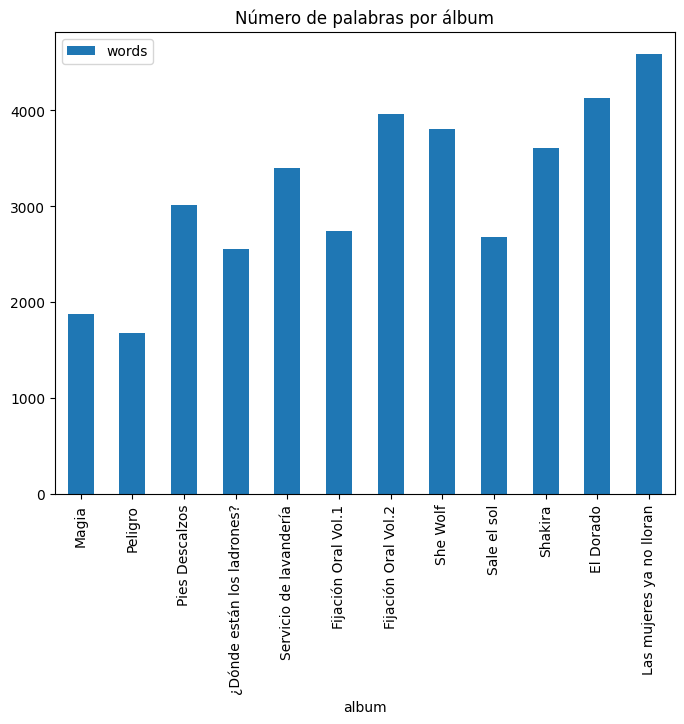

In [51]:
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
plt.rcParams['figure.figsize'] = (8,6)

dff = pd.DataFrame(columns=('album', 'words'))
i=0
for album in albumes:
    num_words = 0
    all_text = ''
    canciones_album = df_canciones[df_canciones['Álbum'] == album]
    for letra in canciones_album['Letra']: # index,row in df_canciones[a].iterrows():
        num_words_this = len(letra.split(" "))
        num_words += num_words_this
    # print(album, num_words)
    dff.loc[i] = (album, num_words) 
    i+=1

# Ordenar el DataFrame `dff` según el orden de `albumes`
print(albumes)
dff['album'] = pd.Categorical(dff['album'], categories=albumes, ordered=True)
dff = dff.sort_values('album')
print(tabulate(dff,headers=dff.columns.tolist(),tablefmt='fancy_grid'))

dff.plot.bar(x='album', y='words', title='Número de palabras por álbum')
plt.show()

In [47]:
import pandas as pd
data = pd.read_csv('letras-shakira.csv',encoding="utf-8",sep=",")
data= data.loc[data['Álbum'] == 'Las mujeres ya no lloran']
arreglo = data['Letra'].values
data.iloc[-1]["Letra"]

'51 ContributorsTranslationsEnglishDeutschالعربيةСрпскиFrançaisPortuguêsShakira: Bzrp Music Sessions, Vol. 53 Lyrics[Letra de "Shakira: Bzrp Music Sessions, Vol. 53"]\n\n[Intro: Shakira]\n(Pa\' tipos como tú, uh-uh-uh-uh)\nOh-oh (Oh-oh)\n(Pa\' tipos como tú, uh-uh-uh-uh)\n\n[Verso 1: Shakira]\nPerdón, ya cogí otro avión\nAquí no vuelvo, no quiero otra decepción\nTanto que te las das de campeón\nY cuando te necesitaba diste tu peor versión\nSorry, baby, hace rato\nQue yo debí botar ese gato\nUna loba como yo no está pa\' novato\'\n\n[Coro: Shakira]\nUna loba como yo no está pa\' tipos como tú, uh-uh-uh-uh\nPa\' tipos como tú, uh-uh-uh-uh\nA ti te quedé grande y por eso estás con una igualita que tú, uh-uh-uh-uh\nOh-oh, oh-oh\n\n[Verso 2: Shakira]\nEsto es pa\' que te mortifique\', mastique\' y trague\', trague\' y mastique\'\nYo contigo ya no regreso, ni que me llores ni me supliquе\'\nEntendí que no es culpa mía quе te critiquen\nYo solo hago música, perdón que te salpique\nMe dejaste 

In [40]:
import pandas as pd
import spacy
from tabulate import tabulate

# Cargar el modelo de idioma español de SpaCy
nlp = spacy.load('es_core_news_sm')

# Función para filtrar los tokens
def filtrar_tokens(texto):
    doc = nlp(texto)
    palabras_filtradas = []
    for token in doc:
        # Filtrar por adjetivos y sustantivos y excluir artículos y palabras específicas
        if token.pos_ in ['ADJ', 'NOUN'] and token.text.lower() not in ['el', 'la', 'los', 'las', 'sí', 'no', 'yeah']:
            palabras_filtradas.append(token.text)
    return palabras_filtradas


# Filtrar el DataFrame para obtener solo las filas con palabras que sean adjetivos o sustantivos
data['Letra_filtrada'] = data['Letra'].apply(filtrar_tokens)
resultados = data[data['Letra_filtrada'].apply(lambda x: len(x) > 0)]


print(tabulate(resultados,headers=resultados.columns.tolist(),tablefmt='fancy_grid'))

╒═════╤══════════════╤═══════╤═══════════════════════════════════════════════════════════════════════════╤════════════╤══════════════════════════╤═══════════════════════════════════════╤═══════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════╤══════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════

In [43]:
import nltk
from nltk.corpus import stopwords
from collections import Counter
nltk.download('stopwords')

def top_n_words(text, n=10):
    # words = text.split()
    words = text
    lista = ["i'm","[verso","[coro]","1]","2]","[chorus]","[","]","coro","precoro","pre-coro"]
    stopwords_list = set(stopwords.words('spanish'))
    stopwords_list_2 = set(stopwords.words('english'))
    filtered_words = [word.lower() for word in words if word.lower() not in stopwords_list 
                      and word.lower() not in stopwords_list_2 and word.lower() not in lista]
    word_counts = Counter(filtered_words)
    sorted_word_counts = sorted(word_counts.items(), key=lambda x: x[1], reverse=True)
    return sorted_word_counts[:n]

# Ejemplo de uso
cadena = []
for i in range(len(resultados)):
    cadena = cadena + resultados.iloc[i]["Letra_filtrada"]

top_10_palabras = top_n_words(cadena)
for palabra, frecuencia in top_10_palabras:
    print(f"{palabra}: {frecuencia}")


uh-uh-uh-uh: 44
tipos: 24
tiempo: 18
buena: 16
also: 16
verte: 12
día: 12
ganas: 10
amor: 10
igualita: 10


[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\mariorith.arellan\AppData\Roaming\nltk_data..
[nltk_data]     .
[nltk_data]   Package stopwords is already up-to-date!


In [34]:
type(resultados.iloc[0]["Letra_filtrada"])

list

### ANALISIS DE SENTIMIENTO

In [50]:
# Import required libraries
import matplotlib.pyplot as plt
from nrclex import NRCLex
from wordcloud import WordCloud, STOPWORDS
import nltk
nltk.download('punkt')

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\mariorith.arellan\AppData\Roaming\nltk_data..
[nltk_data]     .
[nltk_data]   Package punkt is already up-to-date!


True

In [80]:
# Hips don't lie no la reconoce así: Hips Don't Lie (con Wyclef Jean), así que la hago manual
song = genius.search_song(title="Hips Don't Lie",artist="Shakira")

Searching for "Hips Don't Lie" by Shakira...
Done.


In [81]:
for i, row in df_canciones.iterrows():
    if df_canciones.loc[i]['Título']== "Hips Don't Lie (con Wyclef Jean)":
        df_canciones.loc[i]['Título'] = song

C:\Users\mariorith.arellan\AppData\Local\Temp\ipykernel_1760\1274208013.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_canciones.loc[i]['Título'] = song


In [ ]:
from googletrans import Translator

def translate_text(text):
    translator = Translator(service_urls=['translate.googleapis.com'])
    #print(text)
    translation = translator.translate(text, dest='en')
    return translation.text

df_canciones['Emotions'] = None

for i,row in df_canciones.iterrows():
    emotion = NRCLex(translate_text(row['Letra']))
    print(i)
    print(emotion.top_emotions)
    # df_canciones.loc[i]['Emotions'] = emotion.top_emotions

# Salió este error: AttributeError: 'NoneType' object has no attribute 'group'

In [72]:
print(tabulate(df_canciones,headers=df_canciones.columns.tolist(),tablefmt='fancy_grid'))

╒═════╤═══════╤═══════════════════════════════════════════════════════════════════════════╤════════════╤════════════════════════════╤═══════════════════════════════════════╤═══════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════╤════════════╕
│     │   N.º │ Título                                                                    │ Duración   │ Álbum                      │ Título_v2                             │ Letra                                                                                                                                                                 │ Emotions   │
╞═════╪═══════╪═══════════════════════════════════════════════════════════════════════════╪════════════╪════════════════════════════╪═══════════════════════════════════════╪═════════════════════════════════════════════════════════════════════════════════════════════════════════════════════

In [2]:
import pandas as pd

In [3]:
archivo = pd.read_csv("letras-shakira.csv")

In [4]:
archivo

,Unnamed: 0,N.º,Título,Duración,Álbum,Título_v2,Letra
0,0,1.0,Sueños,3:47,Magia,Sueños,10 ContributorsTranslationsPortuguêsSueños Lyr...
1,1,2.0,Esta noche voy contigo,3:53,Magia,Esta noche voy contigo,9 ContributorsEsta Noche Voy Contigo Lyrics[Le...
2,2,3.0,Lejos de tu amor,3:09,Magia,Lejos de tu amor,9 ContributorsLejos De Tu Amor Lyrics[Letra de...
3,3,4.0,Magia,4:43,Magia,Magia,"7 ContributorsMagia Lyrics[Letra de ""Magia""]\n..."
4,4,5.0,Cuentas conmigo,4:01,Magia,Cuentas conmigo,7 ContributorsCuentas Conmigo Lyrics[Letra de ...
...,...,...,...,...,...,...,...
141,141,12.0,TQG (junto a Karol G),3:18,Las mujeres ya no lloran,TQG,44 ContributorsTranslationsDeutschEnglishTQG L...
142,142,13.0,Acróstico (junto a Milán y Sasha),2:51,Las mujeres ya no lloran,Acróstico,16 ContributorsTranslationsEnglishPortuguêsAcr...
143,143,14.0,Copa vacía (junto a Manuel Turizo),2:54,Las mujeres ya no lloran,Copa vacía,14 ContributorsTranslationsEnglishPortuguêsCop...
144,144,15.0,El jefe (junto a Fuerza Regida),2:51,Las mujeres ya no lloran,El jefe,20 ContributorsTranslationsEnglishDeutschPortu...


In [5]:
from tabulate import tabulate
print(tabulate(archivo,headers=archivo.columns.tolist(),tablefmt='grid'))

+-----+--------------+-------+---------------------------------------------------------------------------+------------+----------------------------+---------------------------------------+-----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
|     |   Unnamed: 0 |   N.º | Título                                                                    | Duración   | Álbum                      | Título_v2                             | Letra                                                                                                                                                                 |
+=====+==============+=======+===========================================================================+============+============================+=======================================+==================================================================================================

In [16]:
import os
import time

if os.path.exists('letras.txt'):
    os.remove('letras.txt')

time.sleep(3)
for i,row in archivo.iterrows():
       
    with open('letras.txt', 'a',encoding="utf-8") as the_file:
        print(f"{row['Título']}\nÁlbum: {row['Álbum']}\nDuración: {row['Duración']}\nLetra:\n{row['Letra']}\n\n")
        the_file.write(f"{row['Título']}\nÁlbum: {row['Álbum']}\nDuración: {row['Duración']}\nLetra:\n{row['Letra']}\n\n")
    
    the_file.close()


Sueños
Álbum: Magia
Duración: 3:47
Letra:
10 ContributorsTranslationsPortuguêsSueños Lyrics[Letra de "Sueños"]

[Verso 1]
Siempre soñé con las estrellas
Y en bicicleta ir a ellas
Siempre soñé con ser sirena
Hablar con algas y ballenas
Era mi vida, mi fantasía
No sólo un sueño y nada más
Lo que no sabía era que existías
O que eras mi única verdad

[Coro]
Porque yo no respiro si no estás
No me puedo acostumbrar
Cuento me hadas sin igual
Ya lo sé; no eres perfecto y es verdad
Pero aquí dentro siempre estás
Haces mis sueños realidad

[Verso 2]
Castillos, princesas, qué ironía
Al fin y al cabo fantasías
Mi príncipe azul, mi poesía
No estaba lejos de mi vida
Yo presentía que tú vendrías
Que te amaría hasta el final
Yo tenía un mundo de ilusiones
En el que te guardé un lugar
You might also like[Coro]
Porque yo no respiro si no estás
No me puedo acostumbrar
Cuento me hadas sin igual
Ya lo sé; no eres perfecto y es verdad
Pero aquí dentro siempre estás
Haces mis sueños realidad
Porque yo no res

In [18]:
archivo[archivo['Álbum'] == 'Shakira']

,Unnamed: 0,N.º,Título,Duración,Álbum,Título_v2,Letra
105,105,1.0,Dare (La La La),3:08,Shakira,Dare (La La La),27 ContributorsTranslationsEspañolDare (La La ...
106,106,2.0,Can't Remember to Forget You (con Rihanna),3:27,Shakira,Can't Remember to Forget You,67 ContributorsTranslationsΕλληνικάTürkçeEspañ...
107,107,3.0,Empire,3:59,Shakira,Empire,24 ContributorsTranslationsEspañolEmpire Lyric...
108,108,4.0,You Don't Care About Me,3:42,Shakira,You Don't Care About Me,15 ContributorsTranslationsEspañolYou Don’t Ca...
109,109,5.0,Cut Me Deep (con Magic!),3:15,Shakira,Cut Me Deep,15 ContributorsTranslationsEspañolCut Me Deep ...
110,110,6.0,Spotlight,3:23,Shakira,Spotlight,16 ContributorsTranslationsEspañolSpotlight Ly...
111,111,7.0,Broken Record,3:14,Shakira,Broken Record,18 ContributorsTranslationsEspañolBroken Recor...
112,112,8.0,Medicine (con Blake Shelton),3:21,Shakira,Medicine,16 ContributorsTranslationsEspañolMedicine Lyr...
113,113,9.0,23,4:00,Shakira,23,17 ContributorsTranslationsEspañol23 Lyrics[Ve...
114,114,10.0,The One Thing,3:12,Shakira,The One Thing,18 ContributorsTranslationsEspañolThe One Thin...


In [14]:
album = ""
for i,row in archivo.iterrows():
    if(album != row['Álbum']):
        print(f"\nÁLBUM: {row['Álbum']}")
        album = row['Álbum']
    print(f"- {row['Título']}")


ÁLBUM: Magia
- Sueños
- Esta noche voy contigo
- Lejos de tu amor
- Magia
- Cuentas conmigo
- Cazador de amor
- Gafas oscuras
- Necesito de ti
- Lejos de tu amor (Versión Mix)

ÁLBUM: Peligro
- Eres
- Último momento
- Tú serás la historia de mi vida (You'll Be The Story Of My Life)
- Peligro
- Quince años
- Brujería
- Eterno amor
- Controlas mi destino
- Este amor es lo más bello del mundo
- 1968

ÁLBUM: Pies Descalzos
- Estoy aquí
- Antología
- Un poco de amor (con Howard Glasford)
- Quiero
- Te necesito
- Te espero sentada
- Pies descalzos, sueños blancos
- Vuelve
- Pienso en ti
- ¿Dónde estás corazón?
- Se quiere, se mata
- Estoy aquí (The Love & House Mix) (Pista extra)
- Estoy aquí (Radio edit) (Pista extra)

ÁLBUM: ¿Dónde están los ladrones?
- Ciega, sordomuda
- Si te vas
- Moscas en la casa
- No creo
- Inevitable
- Octavo día
- Que vuelvas
- Tú
- ¿Dónde están los ladrones?
- Sombra de ti
- Ojos así

ÁLBUM: Servicio de lavandería
- Objection (Tango)
- Underneath Your Clothes
- W